<a href="https://colab.research.google.com/github/azhara001/Fabric-Composition-Extraction/blob/main/Inference_Script.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
## importing necessary HF packages -> if in google-colab, please uncomment the following lines and run them followed by restarting the kernel
# !pip install transformers[sentencepiece]
# !pip install tqdm
# !pip install datasets
# !pip install accelerate -U
# !pip install -q pytorch-lightning wandb

In [1]:
# mounting Google Drive (only necessary because I want to import an image from my local directory as a test image) -> an image would come directly
# from the front-end in our case as per my understanding
# mounting GoogleDrive
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Capstone_Repo

Mounted at /content/drive
/content/drive/MyDrive/Capstone_Repo


In [2]:
# importing the loaded pre-trained model from HF Hub -> all you need to run are the three lines of code to import model from HF
from transformers import DonutProcessor, VisionEncoderDecoderModel
import torch

processor = DonutProcessor.from_pretrained("azhara001/donut-base-demo-v2")
model = VisionEncoderDecoderModel.from_pretrained("azhara001/donut-base-demo-v2")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/421 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/8.10k [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/1.30M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/4.02M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.04k [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


config.json:   0%|          | 0.00/4.89k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/809M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/181 [00:00<?, ?B/s]

In [15]:
# importing dummy image + preprocessing steps of the input image
from PIL import Image
rgb_to_gray = False
downsample = False

image_path = '8038.jpg'
image_path = '8021.jpg'
image_path = '8002.jpg'
image_path = '6525.jpg'
image_path = '6530.jpg'
image_path = '6718.jpg'

# reading the image using PIL
if rgb_to_gray:
  im = Image.open(image_path).convert('L')
else:
  im = Image.open(image_path)

# if we are getting a .jpg image from front-end then only execute the below lines
## ______________________ Preprocessing of input image _________________________

if im.size[0] < im.size[1]: # rotate image
    im = im.transpose(Image.ROTATE_90)

image_size = [1280, 960] # starting with the custom image size
processor.image_processor.size = image_size[::-1] # should be (width, height)
processor.image_processor.do_align_long_axis = False

pixel_values = processor(im, return_tensors="pt").pixel_values
print(pixel_values.shape)

task_prompt = "<s_demo_v1>"
decoder_input_ids = processor.tokenizer(task_prompt, add_special_tokens=False, return_tensors="pt")["input_ids"]


torch.Size([1, 3, 1280, 960])


In [16]:
## calling the model and doing an inference

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

outputs = model.generate(pixel_values.to(device),
                               decoder_input_ids=decoder_input_ids.to(device),
                               max_length=model.decoder.config.max_position_embeddings,
                               early_stopping=True,
                               pad_token_id=processor.tokenizer.pad_token_id,
                               eos_token_id=processor.tokenizer.eos_token_id,
                               use_cache=True,
                               num_beams=1,
                               bad_words_ids=[[processor.tokenizer.unk_token_id]],
                               return_dict_in_generate=True,
                               output_scores=True,)

In [17]:
## ______________________ Postprocessing of input image _________________________
import re
sequence = processor.batch_decode(outputs.sequences)[0]
sequence = sequence.replace(processor.tokenizer.eos_token, "").replace(processor.tokenizer.pad_token, "")
sequence = re.sub(r"<.*?>", "", sequence, count=1).strip()  # remove first task start token
processor.token2json(sequence)

{'sample_id': '6718.0',
 'composition': {'polyester': 'None',
  'elastane': '4.0',
  'rayon': 'None',
  'cotton': '96.0',
  'tencel': 'None',
  'nylon': 'None',
  'viscose': 'None',
  'modal': 'None',
  'nylon_6': 'None',
  'nylon_66': 'None',
  'cupro': 'None',
  'micromodal': 'None'}}

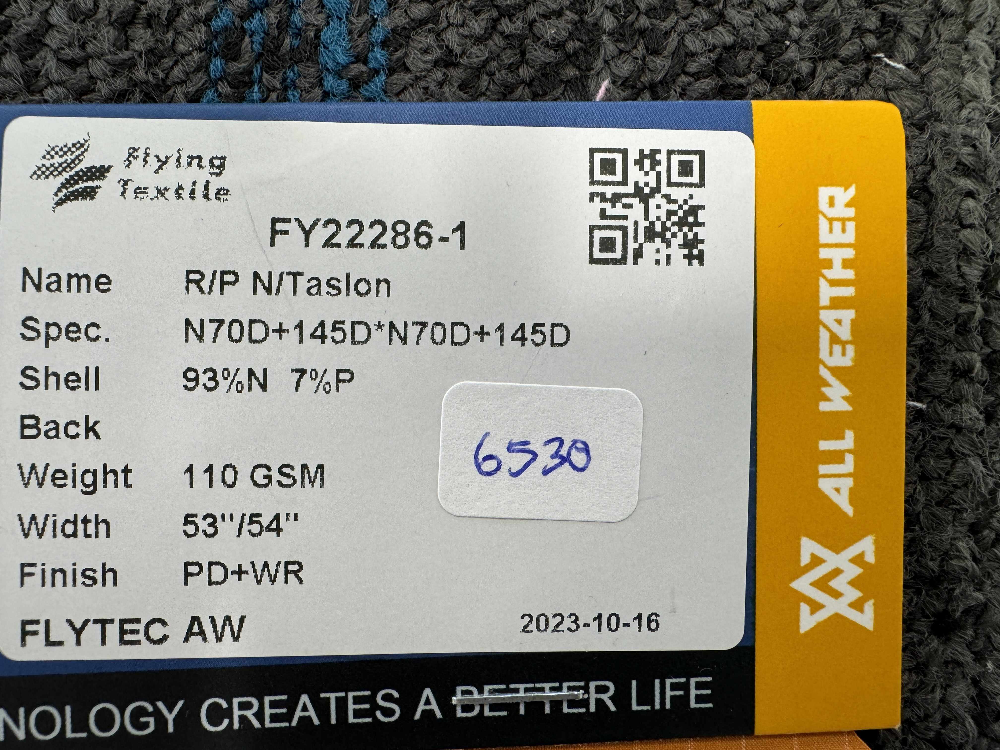

In [14]:
im